In [ ]:
from google.colab import files

files.upload()  # Upload kaggle.json when prompted

{}

In [ ]:
import os
import shutil

# Create the Kaggle directory if it doesn't exist
os.makedirs("/root/.kaggle", exist_ok=True)

# Move the kaggle.json file
shutil.move("kaggle.json", "/root/.kaggle/kaggle.json")

# Set proper permissions
os.chmod("/root/.kaggle/kaggle.json", 600)


In [ ]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
100% 2.70G/2.70G [02:04<00:00, 23.3MB/s]
100% 2.70G/2.70G [02:04<00:00, 23.4MB/s]


In [ ]:
import zipfile

with zipfile.ZipFile("new-plant-diseases-dataset.zip", "r") as zip_ref:
    zip_ref.extractall("plant_disease_data")

print("Dataset extracted successfully!")

Dataset extracted successfully!


In [ ]:
import os

data_dir = "plant_disease_data"
print("Files in dataset:", os.listdir(data_dir))

Files in dataset: ['test', 'New Plant Diseases Dataset(Augmented)', 'new plant diseases dataset(augmented)']


In [ ]:
!pip install colorama

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style

In [ ]:
# find root dir from os

root_dir = os.getcwd()
print(root_dir)

/content


In [ ]:
root_dir = r'/content/plant_disease_data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)'

train_dir = root_dir + "/train"
valid_dir = root_dir + "/valid"

test_dir =  r"/content/plant_disease_data/test"

In [ ]:
Diseases_classes = os.listdir(train_dir)

In [ ]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Tomato___Early_blight', 'Tomato___Target_Spot', 'Grape___Black_rot', 'Tomato___Septoria_leaf_spot', 'Apple___Apple_scab', 'Grape___healthy', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Tomato___Bacterial_spot', 'Tomato___healthy', 'Raspberry___healthy', 'Blueberry___healthy', 'Potato___Early_blight', 'Peach___healthy', 'Peach___Bacterial_spot', 'Grape___Esca_(Black_Measles)', 'Pepper,_bell___Bacterial_spot', 'Tomato___Late_blight', 'Apple___Cedar_apple_rust', 'Soybean___healthy', 'Potato___Late_blight', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Cherry_(including_sour)___Powdery_mildew', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Squash___Powdery_mildew', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Leaf_Mold', 'Apple___Black_rot', 'Pepper,_bell___healthy', 'Cherry_(including_sour)___healthy', 'Apple___healthy', 'Strawberry___healt

In [ ]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)

    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)

    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])

    plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])


print("\nTotal Number of Images in Directory: ", tot_images)


The Number of Images in Tomato___Early_blight: 1920 
The Number of Images in Tomato___Target_Spot: 1827 
The Number of Images in Grape___Black_rot: 1888 
The Number of Images in Tomato___Septoria_leaf_spot: 1745 
The Number of Images in Apple___Apple_scab: 2016 
The Number of Images in Grape___healthy: 1692 
The Number of Images in Corn_(maize)___Common_rust_: 1907 
The Number of Images in Corn_(maize)___healthy: 1859 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Tomato___Bacterial_spot: 1702 
The Number of Images in Tomato___healthy: 1926 
The Number of Images in Raspberry___healthy: 1781 
The Number of Images in Blueberry___healthy: 1816 
The Number of Images in Potato___Early_blight: 1939 
The Number of Images in Peach___healthy: 1728 
The Number of Images in Peach___Bacterial_spot: 1838 
The Number of Images in Grape___Esca_(Black_Measles): 1920 
The Number of Images in Pepper,_bell___Bacterial_spot: 1913 
The Number of Images in 

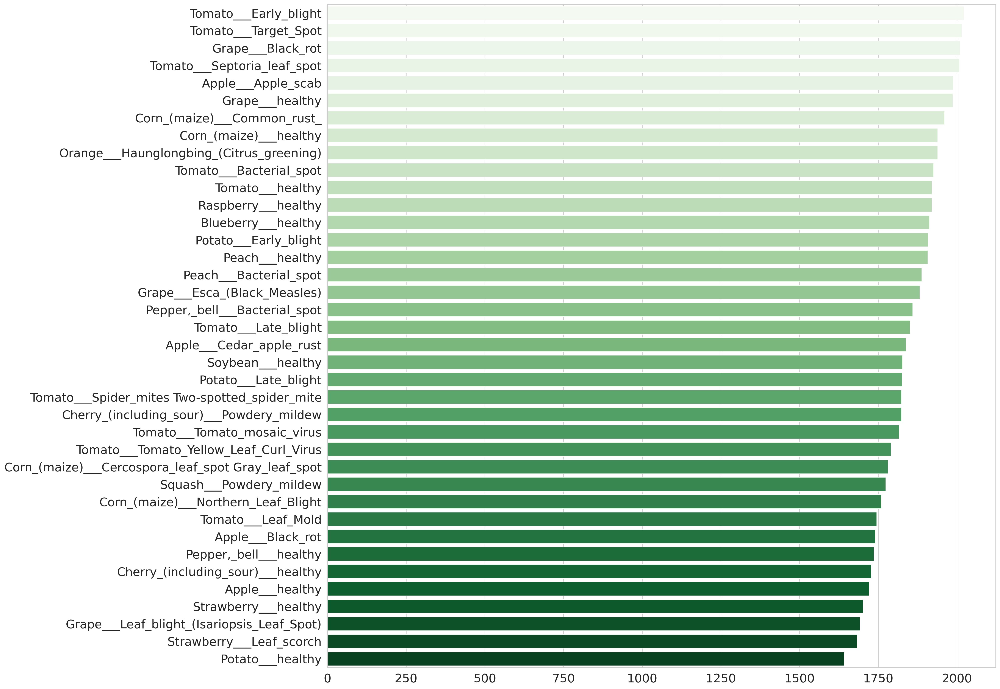

In [ ]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [ ]:
train = ImageFolder(train_dir, transform=transforms.ToTensor())
valid = ImageFolder(valid_dir, transform=transforms.ToTensor())

In [ ]:
train

Dataset ImageFolder
    Number of datapoints: 70295
    Root location: /content/plant_disease_data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
    StandardTransform
Transform: ToTensor()

In [ ]:
train[0]

(tensor([[[0.6549, 0.6510, 0.6471,  ..., 0.7255, 0.7176, 0.7098],
          [0.6667, 0.6627, 0.6588,  ..., 0.7294, 0.7216, 0.7176],
          [0.6667, 0.6627, 0.6588,  ..., 0.7373, 0.7294, 0.7255],
          ...,
          [0.3922, 0.4000, 0.4078,  ..., 0.4941, 0.4941, 0.4941],
          [0.3961, 0.4000, 0.4039,  ..., 0.4784, 0.4824, 0.4824],
          [0.4078, 0.4039, 0.4000,  ..., 0.4745, 0.4784, 0.4824]],
 
         [[0.6392, 0.6353, 0.6314,  ..., 0.7137, 0.7059, 0.6980],
          [0.6510, 0.6471, 0.6431,  ..., 0.7176, 0.7098, 0.7059],
          [0.6510, 0.6471, 0.6431,  ..., 0.7255, 0.7176, 0.7137],
          ...,
          [0.3529, 0.3608, 0.3686,  ..., 0.4314, 0.4314, 0.4314],
          [0.3569, 0.3608, 0.3647,  ..., 0.4157, 0.4196, 0.4196],
          [0.3686, 0.3647, 0.3608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.7686, 0.7647, 0.7608,  ..., 0.8275, 0.8196, 0.8118],
          [0.7804, 0.7765, 0.7725,  ..., 0.8314, 0.8235, 0.8196],
          [0.7804, 0.7765, 0.7725,  ...,

In [ ]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0



Label :Apple___Apple_scab(0)

Label :Apple___Black_rot(1)

Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)

Label :Cherry_(including_sour)___healthy(6)

Label :Corn_(maize)___Common_rust_(8)

Label :Tomato___Septoria_leaf_spot(32)

Label :Tomato___healthy(37)


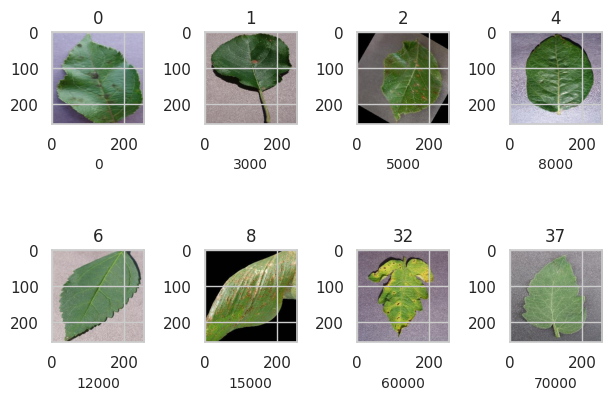

In [ ]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))


image_list = [0, 3000, 5000, 8000, 12000, 15000, 60000, 70000]

chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [ ]:
batch_size = 32

In [ ]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size, num_workers=2, pin_memory=True)

In [ ]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [ ]:
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [ ]:
class ImageClassificationBase(nn.Module):

    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [ ]:
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [ ]:
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)

        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))

    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

In [ ]:
model = to_device(CNN_NeuralNet(3, len(train.classes)), device)
model

CNN_NeuralNet(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inpl

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [ ]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []  #For collecting the results

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    #Sets the learning rate of each parameter group according to the 1cycle learning rate policy.
    #The 1cycle policy anneals the learning rate from an initial learning rate to some
    #maximum learning rate and then from that maximum learning rate to some minimum learning rate
    #much lower than the initial learning rate.
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))


    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # gradient clipping
            #Clip the gradients of an iterable of parameters at specified value.
            #All from pytorch documantation.
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()
             # validation

        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

    return history

In [ ]:
%%time
history = [evaluate(model, valid_dataloader)]
history

CPU times: user 52.4 s, sys: 5.93 s, total: 58.3 s
Wall time: 1min 10s


[{'val_loss': 3.63862943649292, 'val_acc': 0.02909090928733349}]

In [ ]:
num_epoch = 5
lr_rate = 0.01
grad_clip = 0.15
weight_decay = 1e-4
optims = torch.optim.Adam

In [ ]:
%%time
history += fit_OneCycle(num_epoch, lr_rate, model, train_dataloader, valid_dataloader,
                             grad_clip=grad_clip,
                             weight_decay=weight_decay,
                             opt_func=optims)

Epoch [0], train_loss: 0.6743, val_loss: 2.4136, val_acc: 0.5560
Epoch [1], train_loss: 0.3319, val_loss: 0.5521, val_acc: 0.8194
Epoch [2], train_loss: 0.2306, val_loss: 0.2293, val_acc: 0.9253
Epoch [3], train_loss: 0.1018, val_loss: 0.0532, val_acc: 0.9829
Epoch [4], train_loss: 0.0255, val_loss: 0.0211, val_acc: 0.9936
CPU times: user 39min 35s, sys: 39min 26s, total: 1h 19min 1s
Wall time: 1h 22min 34s


In [ ]:
val_acc = []
val_loss = []
train_loss = []

for i in history:
    val_acc.append(i['val_acc'])
    val_loss.append(i['val_loss'])
    train_loss.append(i.get('train_loss'))

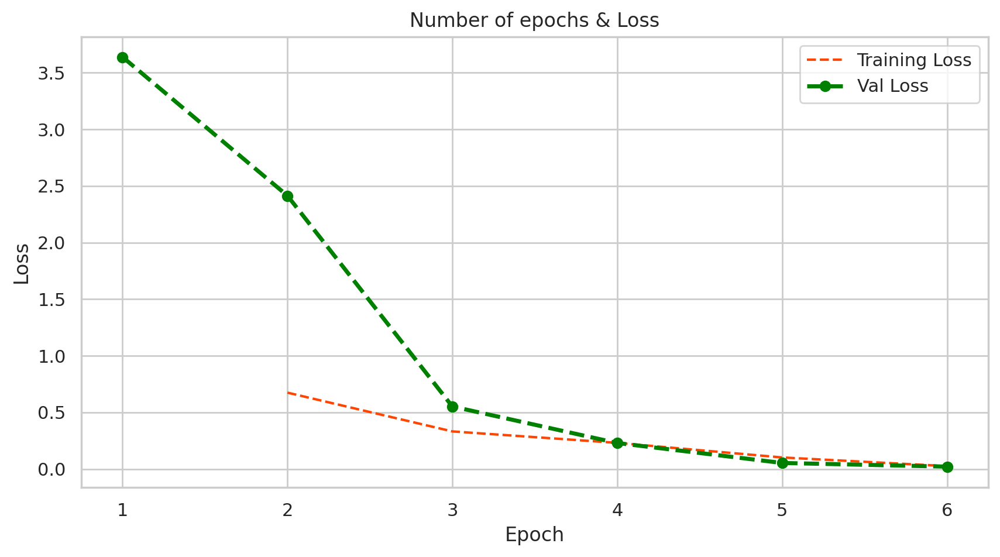

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', color= 'orangered')
plt.plot(epoch_count, val_loss, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Training Loss', 'Val Loss'])
plt.title('Number of epochs & Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(1,7,1))
plt.show();

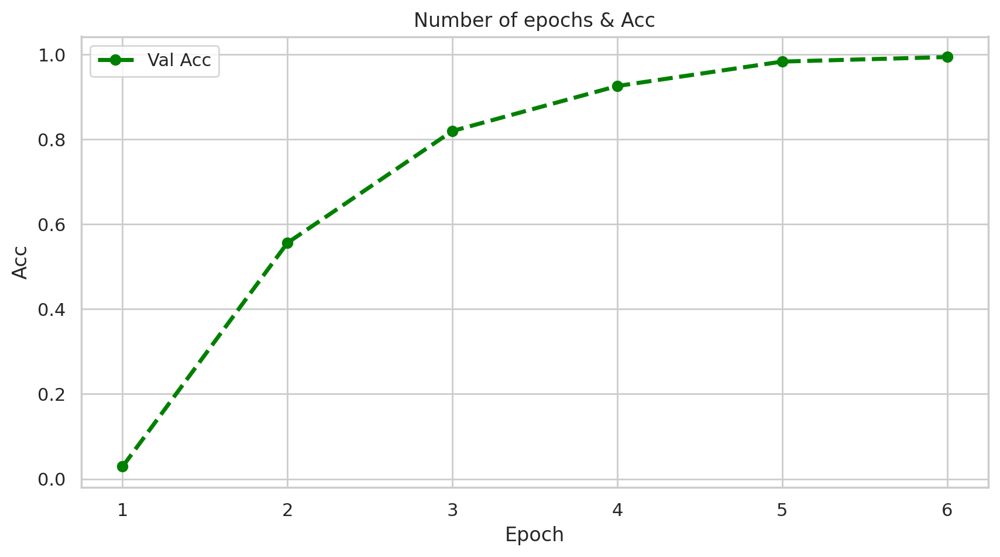

In [ ]:
epoch_count = range(1,7)
plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, '--bo',color= 'green', linewidth = '2.5', label='line with marker')
plt.legend(['Val Acc'])
plt.title('Number of epochs & Acc')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.xticks(np.arange(1,7,1))
plt.show();

In [ ]:
test = ImageFolder(test_dir, transform=transforms.ToTensor())
test_images = sorted(os.listdir(test_dir + '/test'))
print(Fore.GREEN)
print(test_images)
print(len(test_images))


['AppleCedarRust1.JPG', 'AppleCedarRust2.JPG', 'AppleCedarRust3.JPG', 'AppleCedarRust4.JPG', 'AppleScab1.JPG', 'AppleScab2.JPG', 'AppleScab3.JPG', 'CornCommonRust1.JPG', 'CornCommonRust2.JPG', 'CornCommonRust3.JPG', 'PotatoEarlyBlight1.JPG', 'PotatoEarlyBlight2.JPG', 'PotatoEarlyBlight3.JPG', 'PotatoEarlyBlight4.JPG', 'PotatoEarlyBlight5.JPG', 'PotatoHealthy1.JPG', 'PotatoHealthy2.JPG', 'TomatoEarlyBlight1.JPG', 'TomatoEarlyBlight2.JPG', 'TomatoEarlyBlight3.JPG', 'TomatoEarlyBlight4.JPG', 'TomatoEarlyBlight5.JPG', 'TomatoEarlyBlight6.JPG', 'TomatoHealthy1.JPG', 'TomatoHealthy2.JPG', 'TomatoHealthy3.JPG', 'TomatoHealthy4.JPG', 'TomatoYellowCurlVirus1.JPG', 'TomatoYellowCurlVirus2.JPG', 'TomatoYellowCurlVirus3.JPG', 'TomatoYellowCurlVirus4.JPG', 'TomatoYellowCurlVirus5.JPG', 'TomatoYellowCurlVirus6.JPG']
33


In [ ]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]


Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust


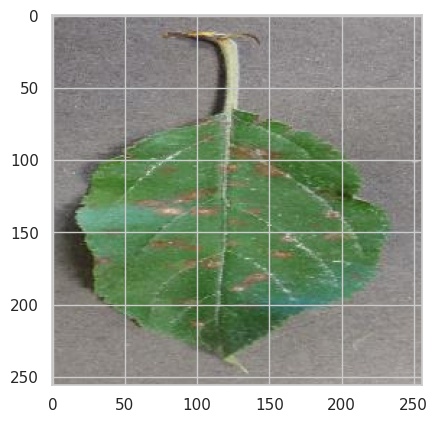

In [ ]:
# predicting first image
img, label = test[1]
plt.imshow(img.permute(1, 2, 0))
print(Fore.GREEN)
print('Label:', test_images[1], ', Predicted:', predict_image(img, model))

In [ ]:
import torch

torch.save(model, 'plant_disease_predic.pth')


In [ ]:
from google.colab import files
files.download('plant_disease_predic.pth')  # For the entire model


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
torch.save(model.state_dict(), 'plant_disease_params.pth')
files.download('plant_disease_params.pth')  # For the model parameters


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
s = ['Tomato___Early_blight', 'Tomato___Target_Spot', 'Grape___Black_rot',
                   'Tomato___Septoria_leaf_spot', 'Apple___Apple_scab', 'Grape___healthy',
                   'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Orange___Haunglongbing_(Citrus_greening)',
                   'Tomato___Bacterial_spot', 'Tomato___healthy', 'Raspberry___healthy', 'Blueberry___healthy',
                   'Potato___Early_blight', 'Peach___healthy', 'Peach___Bacterial_spot', 'Grape___Esca_(Black_Measles)',
                   'Pepper,_bell___Bacterial_spot', 'Tomato___Late_blight', 'Apple___Cedar_apple_rust',
                   'Soybean___healthy', 'Potato___Late_blight', 'Tomato___Spider_mites Two-spotted_spider_mite',
                   'Cherry_(including_sour)___Powdery_mildew', 'Tomato___Tomato_mosaic_virus',
                   'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
                   'Squash___Powdery_mildew', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Leaf_Mold',
                   'Apple___Black_rot', 'Pepper,_bell___healthy', 'Cherry_(including_sour)___healthy',
                   'Apple___healthy', 'Strawberry___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
                   'Strawberry___Leaf_scorch', 'Potato___healthy'
            ]
s.sort()
print(s)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install gdown


In [ ]:
import gdown

# Your Google Drive file link
drive_link = "https://drive.google.com/file/d/11-2YQh8YXRhfjsjYyp9xXEpLJjti89XK/view?usp=sharing"

# Extract the file ID from the link
file_id = drive_link.split('/d/')[1].split('/')[0]

# Define the destination in your Google Drive
destination = "/content/drive/MyDrive/model.pth"  # Change filename if needed

# Download the file
gdown.download(f"https://drive.google.com/uc?id={file_id}", destination, quiet=False)

print("Download complete! File saved in Google Drive.")


Downloading...
From (original): https://drive.google.com/uc?id=11-2YQh8YXRhfjsjYyp9xXEpLJjti89XK
From (redirected): https://drive.google.com/uc?id=11-2YQh8YXRhfjsjYyp9xXEpLJjti89XK&confirm=t&uuid=df1e67f9-ce4a-49a4-8a2a-37b26f91d190
To: /content/drive/MyDrive/model.pth
100%|██████████| 26.4M/26.4M [00:00<00:00, 126MB/s]

Download complete! File saved in Google Drive.
